In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

dir_name="plots"
os.mkdir(f"/kaggle/working/{dir_name}")
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/comment-category-prediction-challenge/Sample.csv
/kaggle/input/comment-category-prediction-challenge/train.csv
/kaggle/input/comment-category-prediction-challenge/test.csv


# Libraries Imported

In [3]:
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
import re
import string
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder,StandardScaler,FunctionTransformer,MaxAbsScaler,MinMaxScaler,TargetEncoder
from sklearn.svm import LinearSVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import TruncatedSVD
from sklearn.compose import ColumnTransformer 
from sklearn.linear_model import LogisticRegression,RidgeClassifier,LogisticRegressionCV,LassoCV,Lasso,SGDClassifier
from sklearn.naive_bayes import MultinomialNB,ComplementNB
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix,f1_score
from sklearn.feature_selection import SelectKBest, chi2,f_classif,RFE,SelectFromModel
from sklearn.pipeline import Pipeline
from scipy.sparse import hstack
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier
from lightgbm import LGBMClassifier
from imblearn.ensemble import BalancedBaggingClassifier

# Loading the Data

In [4]:
train_df=pd.read_csv("/kaggle/input/comment-category-prediction-challenge/train.csv")
test_df=pd.read_csv("/kaggle/input/comment-category-prediction-challenge/test.csv")
X_test=test_df
X_train=train_df.drop("label",axis=1)
print(X_train.shape)
print(X_test.shape)
y_train=train_df['label']

(198000, 14)
(102000, 14)


## Dummy Submission

In [5]:
"""
dmy_clf=DummyClassifier(strategy="most_frequent")

dmy_clf.fit(X_train,y_train)

preds=dmy_clf.predict(X_test)
print(preds.shape)
submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":preds})
submission.to_csv('submission.csv',index=False)
"""

'\ndmy_clf=DummyClassifier(strategy="most_frequent")\n\ndmy_clf.fit(X_train,y_train)\n\npreds=dmy_clf.predict(X_test)\nprint(preds.shape)\nsubmission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),\n                       "label":preds})\nsubmission.to_csv(\'submission.csv\',index=False)\n'

### Checking Data Type of the Columns

In [6]:
numerical_cols=list(train_df.select_dtypes(include=['number']).columns.drop("post_id"))
cols_to_drop=["created_date","comment"]
cat_cols=list(X_train.select_dtypes(include=['object','boolean']).columns.drop(cols_to_drop))
print(numerical_cols)
print(cat_cols)

['emoticon_1', 'emoticon_2', 'emoticon_3', 'upvote', 'downvote', 'if_1', 'if_2', 'label']
['race', 'religion', 'gender', 'disability']


# Exploratory Data Analysis

## 1. Label Balance of the training set

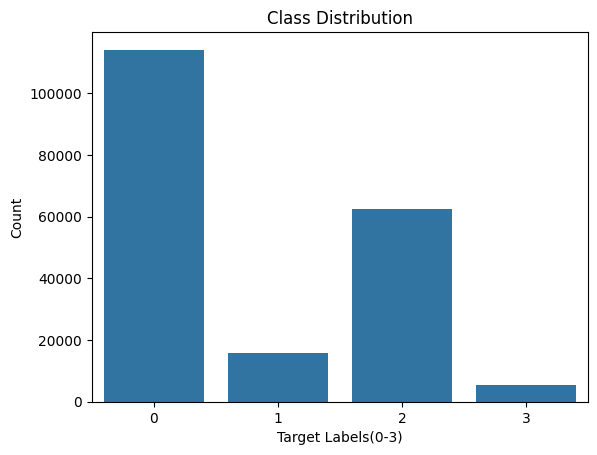

In [7]:
#Label Balance
sns.countplot(x=y_train,data=X_train)
plt.title("Class Distribution")
plt.xlabel("Target Labels(0-3)")
plt.ylabel("Count")
plt.show()

**Class 0 has the highest count at about 113k, followed by class 2 at around 62k, while class 1 is much smaller at roughly 16k and class 3 is the smallest at about 5k. This shows a strong class imbalance, with class 0 having about 7x more samples than class 1 and more than 20x more than class 3. Because of this, the model may favor the majority class unless imbalance handling and class-wise evaluation are used**

## 2. Training data set vs the Test data

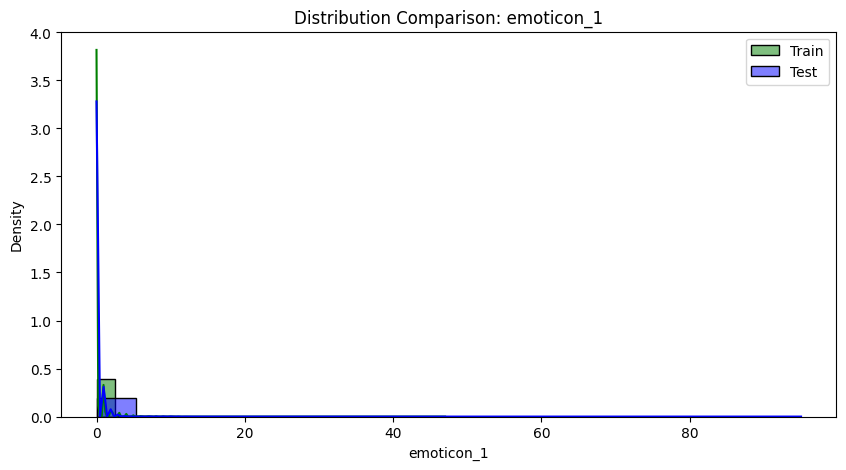

<Figure size 640x480 with 0 Axes>

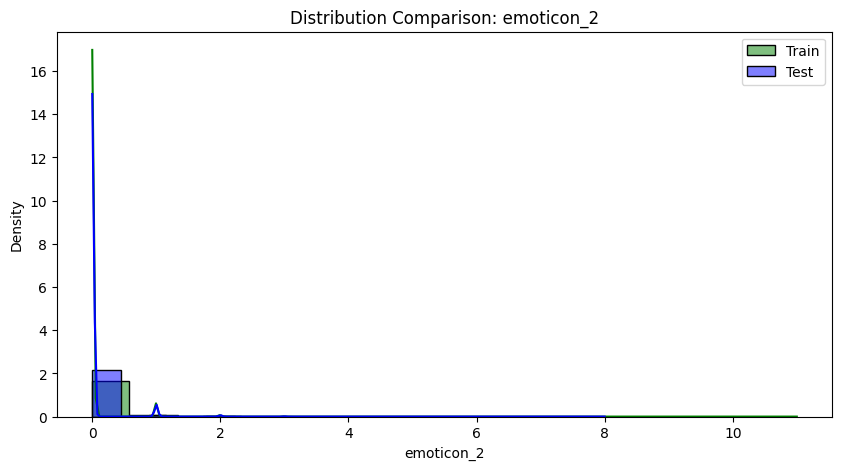

<Figure size 640x480 with 0 Axes>

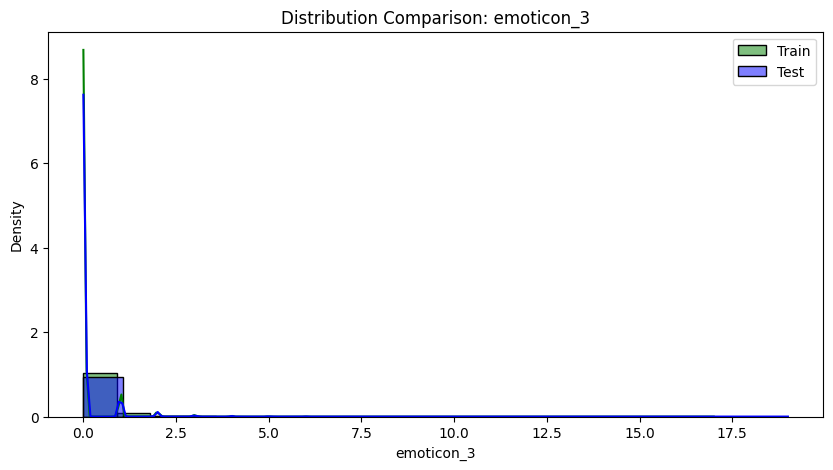

<Figure size 640x480 with 0 Axes>

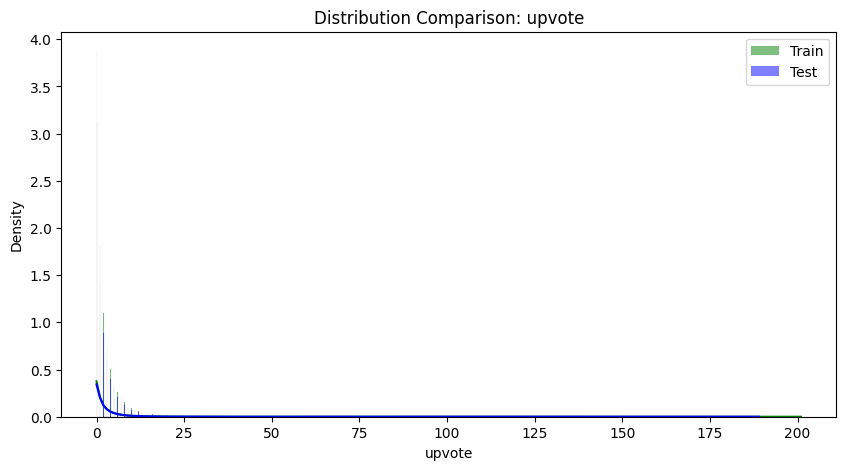

<Figure size 640x480 with 0 Axes>

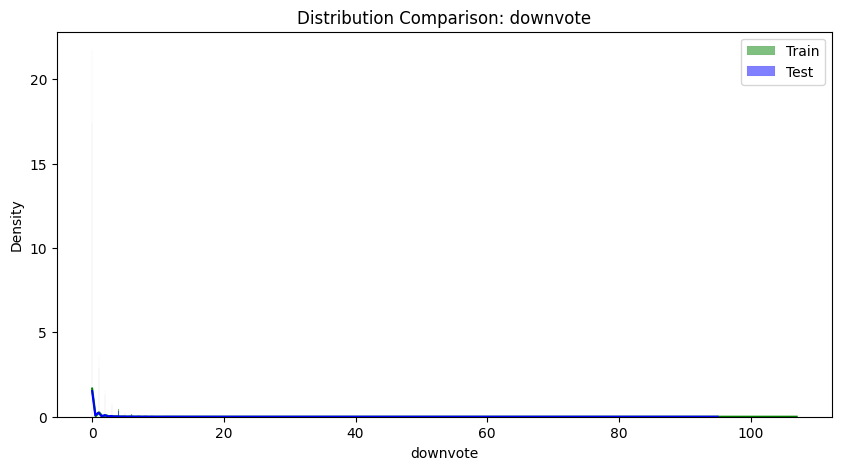

<Figure size 640x480 with 0 Axes>

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


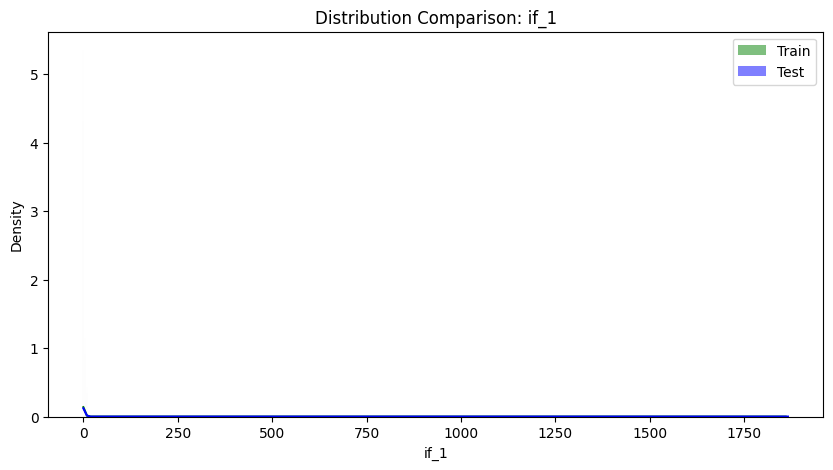

<Figure size 640x480 with 0 Axes>

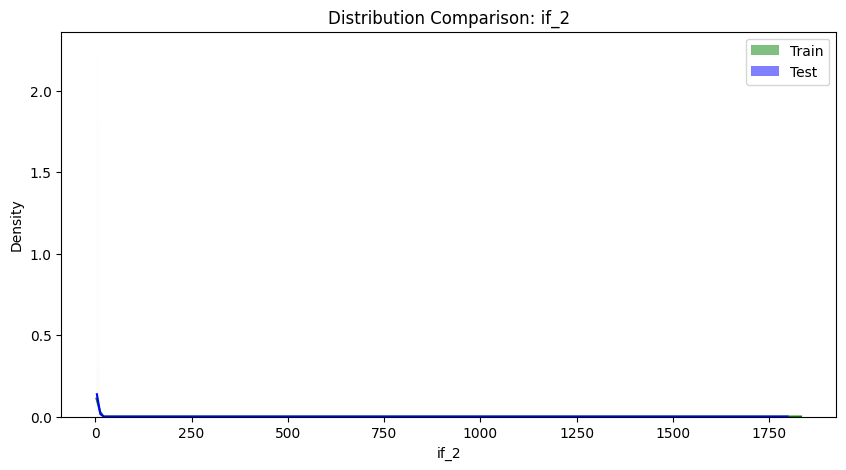

<Figure size 640x480 with 0 Axes>

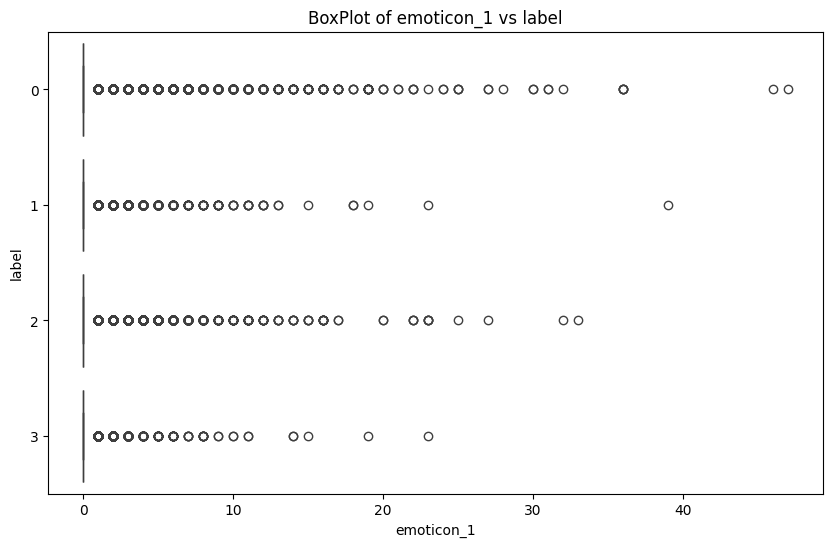

<Figure size 640x480 with 0 Axes>

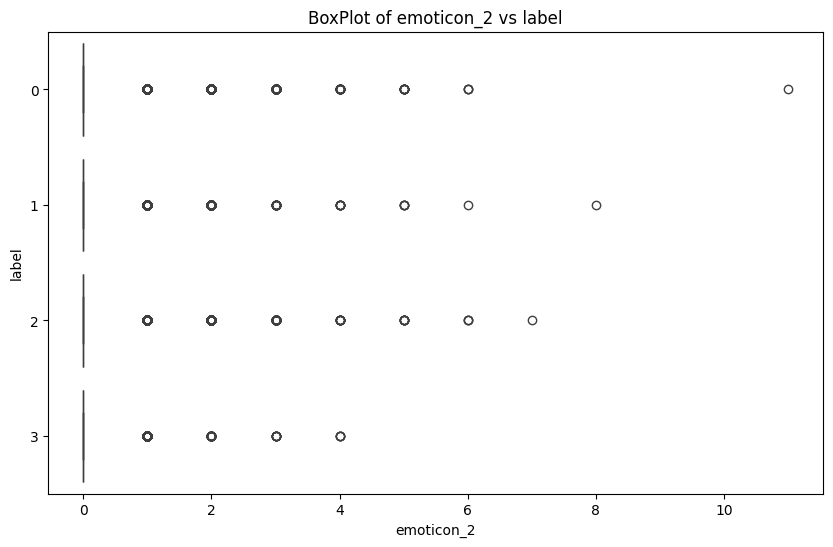

<Figure size 640x480 with 0 Axes>

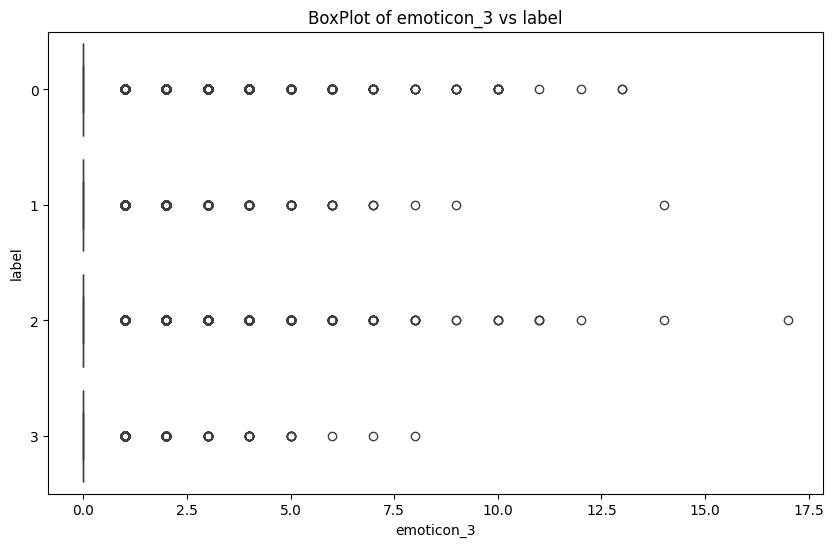

<Figure size 640x480 with 0 Axes>

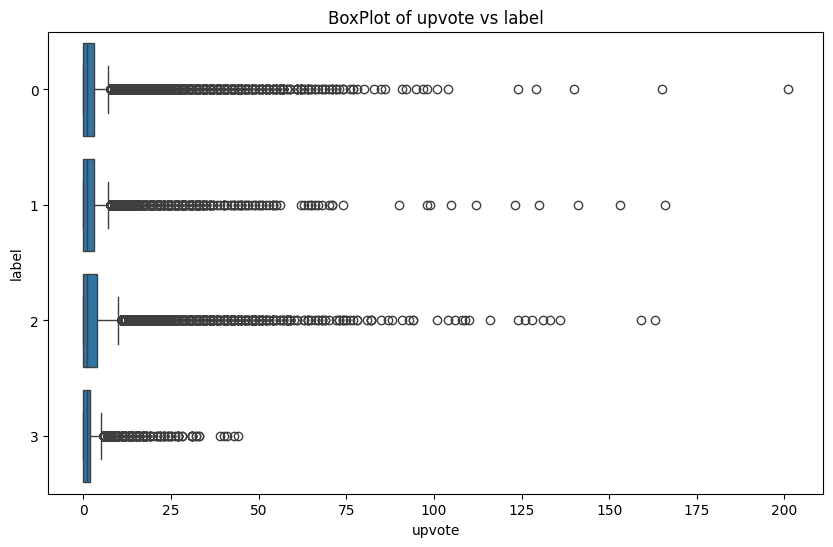

<Figure size 640x480 with 0 Axes>

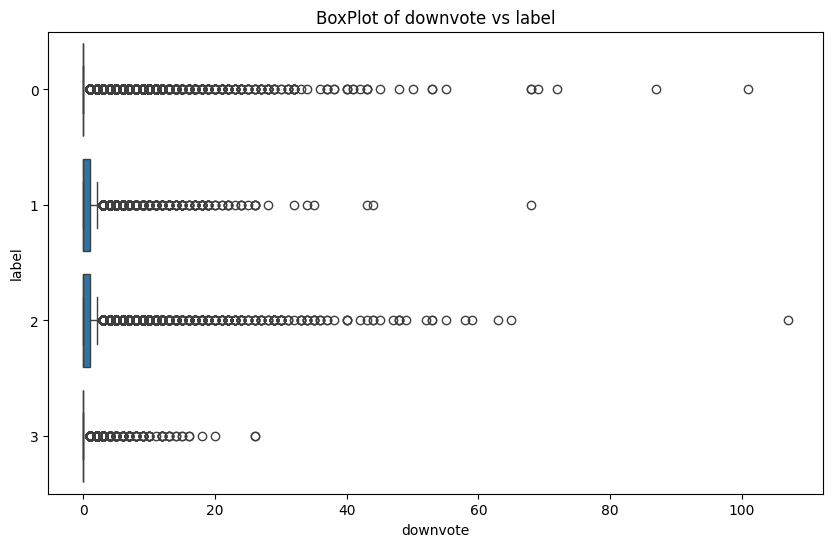

<Figure size 640x480 with 0 Axes>

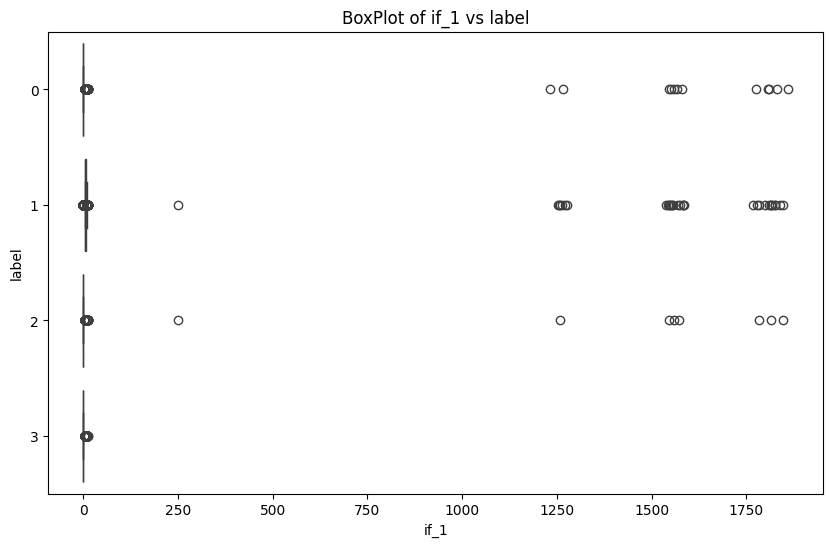

<Figure size 640x480 with 0 Axes>

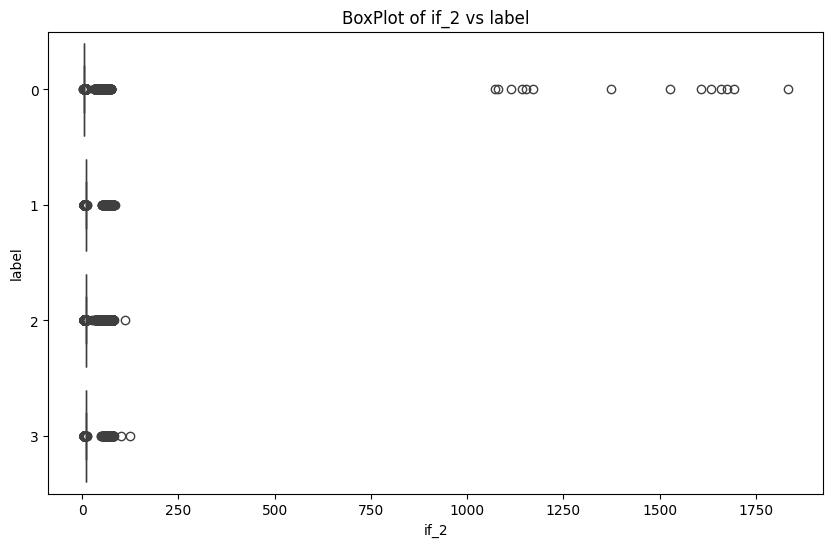

<Figure size 640x480 with 0 Axes>

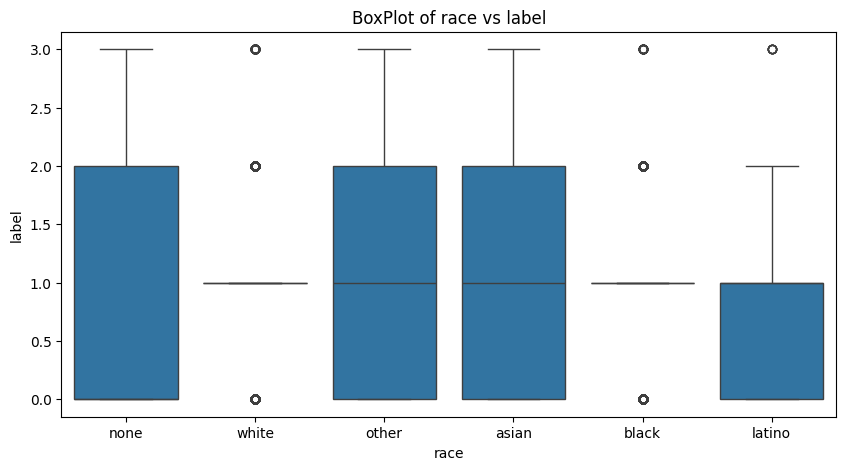

<Figure size 640x480 with 0 Axes>

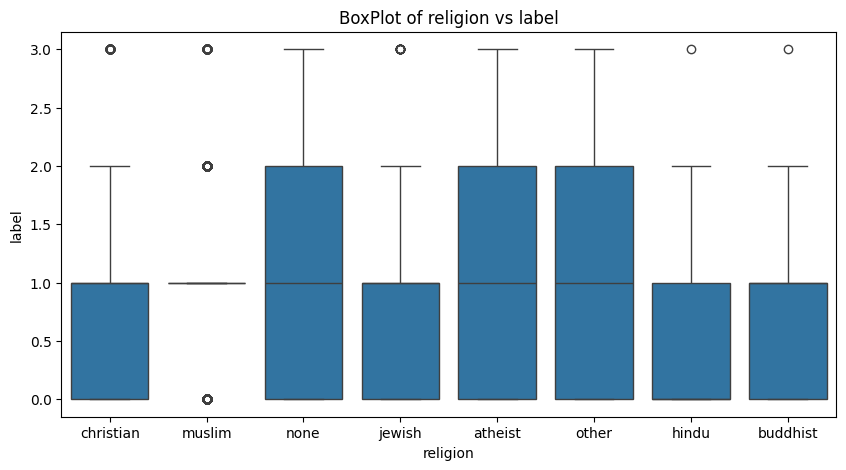

<Figure size 640x480 with 0 Axes>

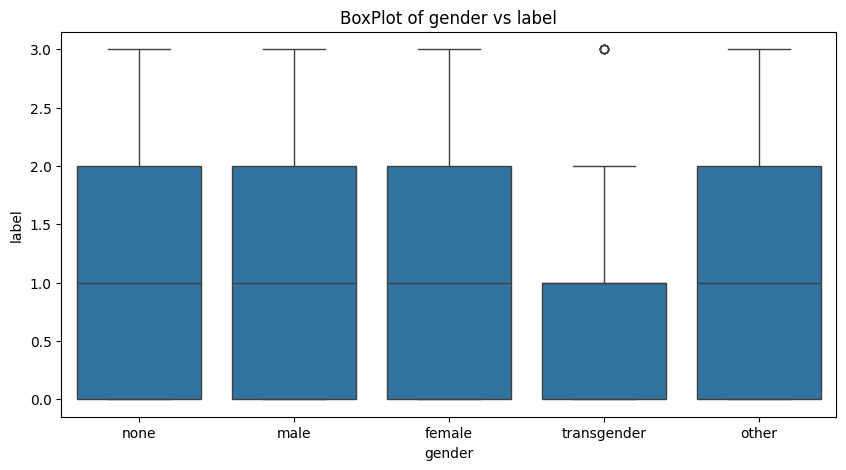

<Figure size 640x480 with 0 Axes>

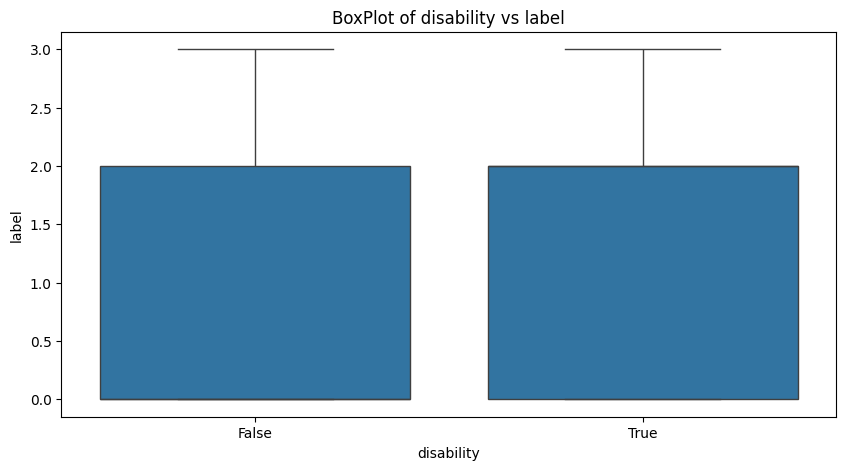

<Figure size 640x480 with 0 Axes>

In [8]:
#Training vs Test

for col in numerical_cols:
    if col not in test_df.columns:
        continue
    plt.figure(figsize=(10,5))

    sns.histplot(train_df[col],color="green",label="Train",kde=True,stat="density",common_norm=False)

    sns.histplot(test_df[col],color="blue",label="Test", kde=True ,stat="density",common_norm=False)

    plt.title("Distribution Comparison: " + col)
    plt.legend()
    plt.show()
    plt.savefig(f"/kaggle/working/plots/{col}.png")

for col in numerical_cols:
    if col not in test_df.columns:
        continue
    plt.figure(figsize=(10,6))
    sns.boxplot(data=train_df,x=col,y=train_df['label'],orient="h")
    plt.title("BoxPlot of " +col + " vs label")
    plt.show()
    plt.savefig(f"/kaggle/working/plots/{col}_boxplot.png")


for col in cat_cols:
    if col not in test_df.columns:
        continue
    plt.figure(figsize=(10,5))
    sns.boxplot(data=train_df,x=col,y=train_df['label'])
    plt.title("BoxPlot of " + col + " vs label")
    plt.show()
    plt.savefig(f"/kaggle/working/plots/{col}_boxplot.png")

## Analysis of above given plots
### 1. The density plots of the numerical columns if_1,if_2,downvote,upvote and emoticons
- The train and test data for if_1 and if_2 features are highly similar both showing strong right skew and clustered near 0. This indicates no noticeable shift between the splits for these features
- The train and test distributions of emoticon_1, emoticon_2, and emoticon_3 are almost overlapping, with most values near zero and only a few high-value outliers. This suggests these features are consistently distributed across splits, indicating no noticeable dataset shift.
- The upvote and downvote features are both heavily right-skewed, with most observations near zero and a few large outliers. The train and test distributions closely overlap, indicating consistent behavior across splits and no major dataset shift.

### 2. The box plots of the numercial columns vs the label
- The emoticon features (emoticon_1, emoticon_2, and emoticon_3) show heavy concentration near zero across all labels, with only a few scattered higher values. This indicates weak class-wise separation, so these features alone may not strongly distinguish between labels, though emoticon_3 appears slightly more variable.
- The upvote and downvote features are strongly right-skewed for every label, with most observations concentrated near zero. The boxes largely overlap across classes, suggesting limited class separation, although upvote has a slightly broader range and more extreme outliers than downvote.
- The if_1 and if_2 features are heavily concentrated near zero across all labels, indicating that most comments do not strongly express these identity-related signals. A few very large outliers appear in classes 0 and 1, showing that these features can occasionally take extreme values and may help capture rare but important patterns.

### 3. Box plot of categorical columns vs the label
- The race feature shows noticeable variation across categories, with none, other, and asian spanning a wider label range than white and black. This suggests race-related mentions may be more associated with labels 1 and 2 than with a single dominant class, though the overlap is still large.
- The religion feature appears strongest for none, atheist, and other, while categories like christian, hindu, and buddhist show lower central tendency. This indicates religion-related identity terms may be more prominent in some toxic or flagged comments, but the separation is not very sharp.
- The gender feature is distributed across all labels, but transgender stands out with a narrower spread and a slightly different pattern than the other groups. Overall, gender-related terms seem present across multiple labels, suggesting they may contribute to classification but are not alone enough to clearly separate classes.
- The disability feature is fairly similar for False and True, with both covering nearly the full label range. This means disability-related text exists in both benign and toxic comments, so the feature may be useful but does not strongly distinguish labels by itself.

## 3. Visualization

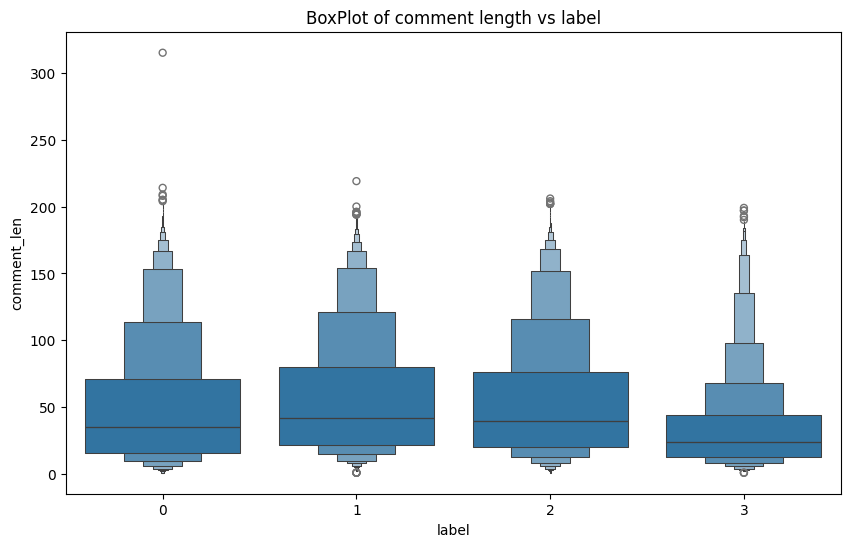

<Figure size 640x480 with 0 Axes>

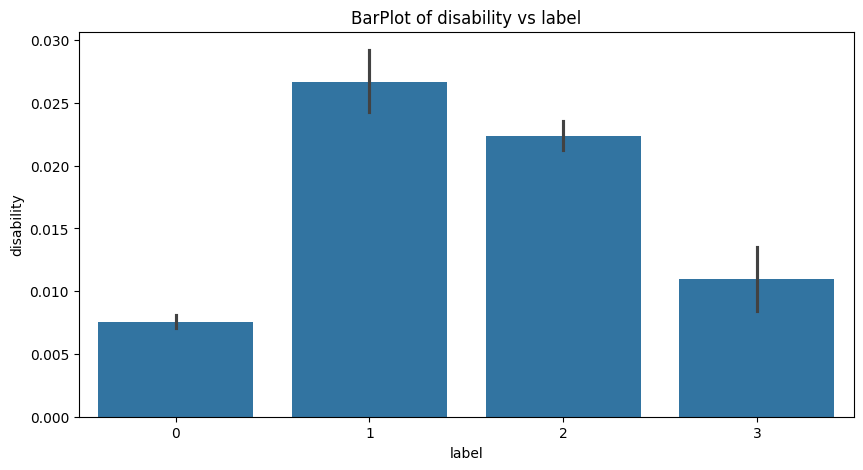

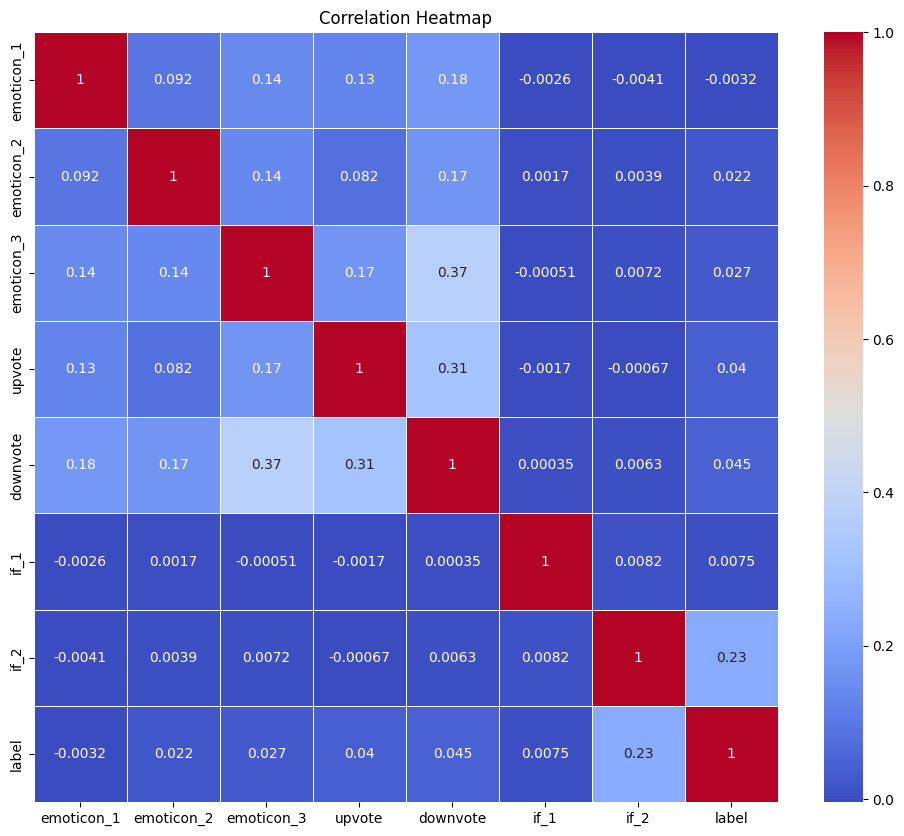

<Figure size 640x480 with 0 Axes>

In [9]:
#For comment column word count can be kept and used to check if it aligns with the label
train_df["comment_len"]=train_df["comment"].apply(lambda x:len(str(x).split()))
plt.figure(figsize=(10,6))
sns.boxenplot(data=train_df,x=train_df['label'],y=train_df["comment_len"])
plt.title("BoxPlot of comment length vs label")
plt.show()
plt.savefig("/kaggle/working/plots/comment_len_boxenplot.png")

#For disability feature barplot can be used
plt.figure(figsize=(10,5))
sns.barplot(data=train_df,x=train_df['label'],y=train_df['disability'])
plt.title("BarPlot of disability vs label") 
plt.savefig("/kaggle/working/plots/disability_barplot.png")

#Correlation Heatmap
plt.figure(figsize=(12,10))
corr=train_df[numerical_cols].corr()
sns.heatmap(corr,annot=True,cmap="coolwarm",linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()
plt.savefig("/kaggle/working/plots/correlation_heatmap.png")

## Analysis of above given plots
### Box plot of comment length vs labels
- The comment length boxen plot suggests label 1 and label 2 have slightly higher typical comment lengths than label 3, while label 0 sits in the middle. All labels show long right tails and many outliers, which means comment length alone does not cleanly separate the classes but can still provide some signal

### BarPlot of disability 
- The disability bar plot shows that label 1 has the highest average disability score at about 0.026–0.027, followed by label 2 at about 0.022, while label 0 is the lowest at around 0.007–0.008 and label 3 is in between at about 0.011. This suggests disability-related language is more associated with the mid-level toxicity classes than with the benign class.

### Correlation heatmap
- The heatmap shows that downvote has the strongest relationship with the label, with a correlation of about 0.045, while upvote is slightly lower at 0.04 and the emoticon features are all weaker than 0.03. if_2 has the highest feature-to-feature link among the identity variables, with correlation around 0.23 with the label, making it the most informative among those shown.

## 4. Statistical Analysis

In [10]:
#Statistical Summary
display(
    train_df.describe()
    .rename(index={'50%': 'median'})
    .style.format("{:.2f}")
    .background_gradient(cmap='Blues')
)

def cramers_v(confusion_matrix):
    chi12= st.chi2_contingency(confusion_matrix)[0]
    n=confusion_matrix.sum().sum()

    min_dim=min(confusion_matrix.shape)-1

    return np.sqrt(chi12/(n*min_dim))
#Calculating group means and chi square tests are done to check dependecny of categorcial features on target label
#Cramer's V to check the association is between the categorical and the target labels
for col in cat_cols:
    if col not in test_df.columns:
        continue
    print(f"Value counts for {col} in train:")
    print(train_df[col].value_counts())
    print("Mode of the column:",train_df[col].value_counts().index[1]) # Since maxium is none the next index is taken as mode
    print("\n")
    #Group mean
    group_means=train_df.groupby(col)['label'].mean().sort_values()
    print(f"Group means for {col}:\n{group_means}\n")

    #Chi-Square Test
    cont_table=pd.crosstab(train_df[col],train_df['label'])

    Chi2,p,dof,expected=st.chi2_contingency(cont_table)
    print(f"Chi-Square Test for {col}:")
    print(f"Chi2 Statistic: {Chi2}, p-value: {p}\n")

    #Cramer’s V
    print(f"Cramer's V for {col}: {cramers_v(cont_table)}\n" )

,post_id,emoticon_1,emoticon_2,emoticon_3,upvote,downvote,if_1,if_2,label,comment_len
count,198000.00,198000.00,198000.00,198000.00,198000.00,198000.00,198000.00,198000.00,198000.00,198000.00
mean,68.45,0.28,0.05,0.12,2.61,0.67,1.91,7.96,0.79,52.40
std,27.95,1.02,0.26,0.48,5.05,2.04,25.64,14.84,0.98,45.77
min,20.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,0.00,1.00
25%,39.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,18.00
median,72.00,0.00,0.00,0.00,1.00,0.00,0.00,6.00,0.00,37.00
75%,72.00,0.00,0.00,0.00,3.00,1.00,4.00,10.00,2.00,73.00
max,129.00,47.00,11.00,17.00,201.00,107.00,1860.00,1833.00,3.00,315.00


Value counts for race in train:
race
none      39682
white      5486
black      3869
other      1654
asian      1263
latino      623
Name: count, dtype: int64
Mode of the column: white


Group means for race:
race
latino    0.808989
asian     0.828187
none      0.831082
other     0.908706
black     1.000258
white     1.065986
Name: label, dtype: float64

Chi-Square Test for race:
Chi2 Statistic: 9939.955665607407, p-value: 0.0

Cramer's V for race: 0.2510346642047203

Value counts for religion in train:
religion
none         38249
christian     7191
muslim        4930
jewish        1244
other          547
atheist        219
buddhist       100
hindu           97
Name: count, dtype: int64
Mode of the column: christian


Group means for religion:
religion
hindu        0.680412
christian    0.747462
buddhist     0.760000
none         0.875343
jewish       0.909968
atheist      0.926941
other        0.954296
muslim       0.992901
Name: label, dtype: float64

Chi-Square Test for religion:
Ch

## Chi-square test and p-values
- Chi-square test checks whether a categorical feature and the target label are independent.A very small p-value means we reject independence, so the feature is related to the label. Cramer's V measures the strength of that relationship on a scale from 0 to 1. Values closer to 0 mean weak association; values closer to 1 mean strong association.
## Analysis of Cramer's V and p-value
- Race: Chi2 = 9939.96, p-value = 0.0, Cramer's V = 0.251
- This is the strongest of the four, suggesting race-related terms have the clearest association with the label.

- Religion: Chi2 = 5852.64, p-value = 0.0, Cramer's V = 0.193
- This also shows a strong and significant relationship, though weaker than race.

- Gender: Chi2 = 620.84, p-value = 3.76e-125, Cramer's V = 0.063
- The association is statistically significant, but the effect size is small.

- Disability: Chi2 = 857.56, p-value = 1.42e-185, Cramer's V = 0.066
- This is also significant, with a similarly weak-to-small effect size.

- The chi-square tests show that race, religion, gender, and disability are all significantly associated with the target label, as indicated by extremely small p-values. However, Cramer's V suggests the strength of association is moderate for race and religion, and weak for gender and disability, meaning these features are statistically significant but not equally strong predictors.

## 5. Cleaning the dataset

In [11]:
#Race,Religion and gender hav a high amout of null values
#print(train_df['race'].value_counts())
#print(train_df['religion'].value_counts())
#print(train_df['gender'].value_counts())
train_df['race'].replace('none',np.nan,inplace=True)
train_df['religion'].replace('none',np.nan,inplace=True)
train_df['gender'].replace('none',np.nan,inplace=True)
test_df['race'].replace('none',np.nan,inplace=True)
test_df['religion'].replace('none',np.nan,inplace=True)
test_df['gender'].replace('none',np.nan,inplace=True)
print(train_df.isnull().sum())
#print(train_df['race'].value_counts())
#print(train_df['religion'].value_counts())
#print(train_df['gender'].value_counts())
train_df['race'].fillna('unknown',inplace=True)
train_df['religion'].fillna('unknown',inplace=True)
train_df['gender'].fillna('unknown',inplace=True)
train_df.dropna(subset=['comment'],inplace=True)
test_df['race'].fillna('unknown',inplace=True)
test_df['religion'].fillna('unknown',inplace=True)
test_df['gender'].fillna('unknown',inplace=True)
print("No.of Null values after filling null")
print(train_df.isnull().sum())

#Clean the comments colums
#Lowering the strings
#Replacig hashtags and any @ refrences
#Removing all punctuation
#Remving numbers,spaces and trimming the edges
train_df['cleaned_comments']=(
            train_df['comment'].fillna('')
            .str.lower()
            .str.replace(r'@w\+|#\w+','',regex=True)
            .str.translate(str.maketrans('','',string.punctuation))
            .str.replace(r'\d+','',regex=True)
            .str.replace(r'\s+',' ',regex=True)
            .str.strip()
)
test_df['cleaned_comments']=(
            test_df['comment'].fillna('')
            .str.lower()
            .str.replace(r'@w\+|#\w+','',regex=True)
            .str.translate(str.maketrans('','',string.punctuation))
            .str.replace(r'\d+','',regex=True)
            .str.replace(r'\s+',' ',regex=True)
            .str.strip()
)
X_train=train_df.drop('label',axis=1)
y_train=train_df['label']

created_date         0
post_id              0
emoticon_1           0
emoticon_2           0
emoticon_3           0
upvote               0
downvote             0
if_1                 0
if_2                 0
race            185105
religion        183672
gender          181584
disability           0
comment              1
label                0
comment_len          0
dtype: int64


/tmp/ipykernel_55/695535900.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df['race'].replace('none',np.nan,inplace=True)
/tmp/ipykernel_55/695535900.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try us

No.of Null values after filling null
created_date    0
post_id         0
emoticon_1      0
emoticon_2      0
emoticon_3      0
upvote          0
downvote        0
if_1            0
if_2            0
race            0
religion        0
gender          0
disability      0
comment         0
label           0
comment_len     0
dtype: int64


/tmp/ipykernel_55/695535900.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  test_df['race'].fillna('unknown',inplace=True)
/tmp/ipykernel_55/695535900.py:20: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 

# Train Validation Splt

In [12]:
#Train-Validation Split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
print(X_train.columns)
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
#Perctange of split
train_percentage = len(X_train) / (len(X_train) + len(X_val)) * 100
val_percentage = len(X_val) / (len(X_train) + len(X_val)) * 100
print(f"Training set percentage: {train_percentage:.2f}%")
print(f"Validation set percentage: {val_percentage:.2f}%")

Index(['created_date', 'post_id', 'emoticon_1', 'emoticon_2', 'emoticon_3',
       'upvote', 'downvote', 'if_1', 'if_2', 'race', 'religion', 'gender',
       'disability', 'comment', 'comment_len', 'cleaned_comments'],
      dtype='object')
Training set shape: (158399, 16) (158399,)
Validation set shape: (39600, 16) (39600,)
Training set percentage: 80.00%
Validation set percentage: 20.00%


## Checking for outliers

In [13]:
#Checking for outliers
numerical_cols=[i for i in numerical_cols if i!='label']
for col in numerical_cols:
    if col not in test_df.columns:
        continue
    mean=X_train[col].mean()
    std=X_train[col].std()

    lower,upper=mean-1.5*std,mean+1.5*std
    outlier_count= ((X_train[col]<lower)|(X_train[col]>upper)).sum()
    print(f"{col}: {outlier_count} outliers (mean={mean:.1f}, std={std:.1f})")

skewness=X_train[numerical_cols].skew()
print(skewness)
# log1p transformation
#X_train_log = X_train.copy()
#X_test_log = test_df.copy()

#for col in numerical_cols:
#    if col in numerical_cols:
#        X_train[col] = np.log1p(X_train[col])

#skewness after transformation
skewness_log = X_train[numerical_cols].skew()
print(skewness_log)

emoticon_1: 8937 outliers (mean=0.3, std=1.0)
emoticon_2: 6463 outliers (mean=0.0, std=0.3)
emoticon_3: 13742 outliers (mean=0.1, std=0.5)
upvote: 7890 outliers (mean=2.6, std=5.1)
downvote: 7791 outliers (mean=0.7, std=2.0)
if_1: 39 outliers (mean=1.9, std=25.2)
if_2: 3132 outliers (mean=8.0, std=15.7)
emoticon_1    10.132907
emoticon_2     7.698839
emoticon_3     7.158082
upvote         7.169456
downvote      10.297271
if_1          64.687929
if_2          67.820662
dtype: float64
emoticon_1    10.132907
emoticon_2     7.698839
emoticon_3     7.158082
upvote         7.169456
downvote      10.297271
if_1          64.687929
if_2          67.820662
dtype: float64


### Analysis of detected outliers
- Based on standard iqr method to detect outliers the amount of outliers for each feature is very huge and for the largest amount it accounts to almost

## TFIDF Vectorization

In [14]:
#Find top keywords in comment column for each label
tfidf_vectorizer=TfidfVectorizer(stop_words="english",max_features=5000,ngram_range=(1,2))
#ohe=OneHotEncoder()
#ohe.fit_transform(X_train["cleaned_comments"].fillna(""))
tfidf_matrix = tfidf_vectorizer.fit_transform(X_train["cleaned_comments"].fillna(""))
X_train_temp=X_train.copy()
X_train_temp['label']=y_train.values
print("Top keywords for each label:")
for label in sorted(X_train_temp['label'].unique()):
    label_mask=(X_train_temp['label']==label)
    rows=tfidf_matrix[label_mask.values]
    mean_weights=np.asarray(rows.mean(axis=0)).flatten()
    
    features=tfidf_vectorizer.get_feature_names_out()
    top_indices=mean_weights.argsort()[::-1][:10]
    top_keywords=[features[i] for i in top_indices]
    print(f"Label {label}: {top_keywords}")

Top keywords for each label:
Label 0: ['just', 'people', 'like', 'dont', 'trump', 'good', 'time', 'think', 'know', 'did']
Label 1: ['white', 'black', 'people', 'muslims', 'muslim', 'women', 'just', 'like', 'dont', 'gay']
Label 2: ['trump', 'like', 'just', 'people', 'dont', 'think', 'know', 'right', 'time', 'president']
Label 3: ['kill', 'shoot', 'people', 'death', 'shot', 'just', 'killing', 'lock', 'die', 'killed']


## Preprocessing

In [15]:
text_col='cleaned_comments'
X_train['created_date']=pd.to_datetime(X_train['created_date'])
X_val['created_date']=pd.to_datetime(X_val['created_date'])
test_df['created_date']=pd.to_datetime(test_df['created_date'])
X_train['is_weekend']=X_train['created_date'].dt.dayofweek.isin([5,6]).astype(int)
X_val['is_weekend']=X_val['created_date'].dt.dayofweek.isin([5,6]).astype(int)
test_df['is_weekend']=test_df['created_date'].dt.dayofweek.isin([5,6]).astype(int)
req_feats=numerical_cols+cat_cols+[text_col]+['created_date','is_weekend']
req_feats = [f for f in req_feats if f != 'label']

def extract_date(df):
    dates=pd.to_datetime(df.iloc[:,0])
    return np.c_[dates.dt.day,dates.dt.month,dates.dt.year]

date_transformer= Pipeline([
    ('date_feats',FunctionTransformer(extract_date)),
    ('impute',SimpleImputer(strategy='median')),
    ('scaler',MinMaxScaler())
])
preprocesser=ColumnTransformer(
    transformers=[
        ('text',tfidf_vectorizer,text_col),
        ('date',date_transformer,['created_date']),
        #('cat',OneHotEncoder(drop='first',handle_unknown='ignore'),['race','religion','gender','disability']),
        ('cat',TargetEncoder(),['race','religion','gender','disability','is_weekend']),
        ('num',MaxAbsScaler(),['emoticon_1', 'emoticon_2', 'emoticon_3', 'upvote', 'downvote', 'if_1', 'if_2'])
    ]
)
pipeline=Pipeline([
        ('prep',preprocesser),
        ('select',SelectKBest(score_func=chi2, k=1600)),
    ])

X_train_final=pipeline.fit_transform(X_train[req_feats].fillna({'cleaned_comments':' '}),y_train)
X_val_final=pipeline.transform(X_val[req_feats].fillna({'cleaned_comments':' '}))
X_test=pipeline.transform(test_df[req_feats].fillna({'cleaned_comments':' '}))
print(f"Final Matrix Shape: {X_train_final.shape}")
print("Validation matrix shape",X_val_final.shape,y_val.shape)

Final Matrix Shape: (158399, 1600)
Validation matrix shape (39600, 1600) (39600,)


### Scaling and Encoding 
- Scaling is MaxAbsScaler because the select k best selection requires positive values only. 
- Encoding is Target Encoding because it reduces dimensionality and preserves target related signal. It replaces each category with the mean target value for that category. The encoded value reflects how strongly that category is associated with the target.

### Feature Selection
- Select K best is used to reduce the no.of features generated by the tfidf vectorization by computing chi-sqaure score for every feature vs the target and selects the top k features based on that.

# Model Building

## 1. Logistic Regression
* Primary Base line model
* It creates a linear decision boundary between the labels by drawing straight lines
* It combines the weight of all features and calculates a probabilty percentage
* Finally it preidcts the label with the highest score

Logistic Regression
Macro F1 score on Training:  0.661629736719339
Macro F1 score on Validation:  0.6451454390558953
Report
              precision    recall  f1-score   support

           0       0.86      0.78      0.82     22652
           1       0.56      0.81      0.66      3230
           2       0.77      0.69      0.73     12621
           3       0.25      0.73      0.37      1097

    accuracy                           0.75     39600
   macro avg       0.61      0.75      0.65     39600
weighted avg       0.79      0.75      0.76     39600



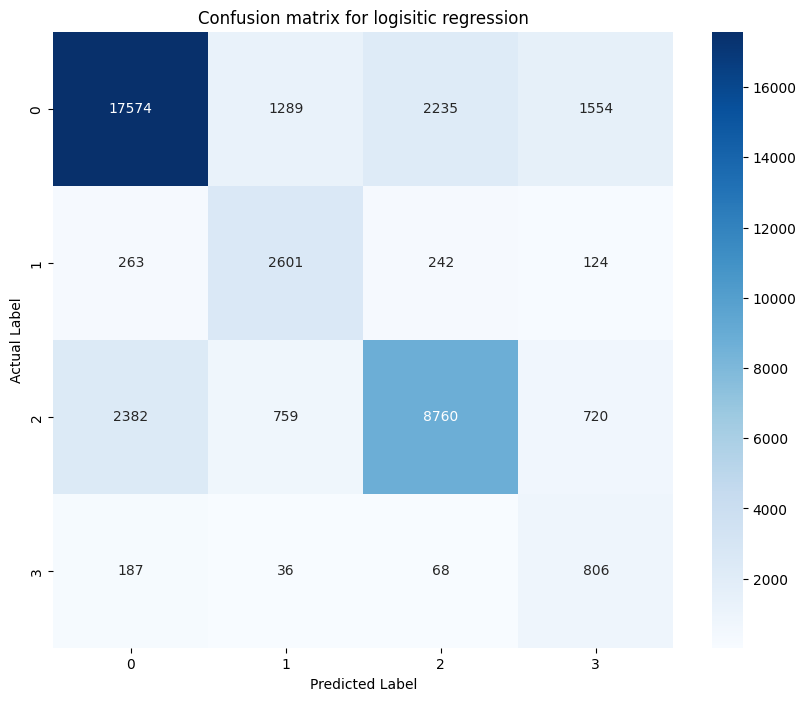

'\ntest_predictions=logreg.predict(X_test)\nprint(pd.Series(test_predictions).value_counts())\nsubmission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),\n                       "label":test_predictions})\nsubmission.to_csv(\'submission.csv\',index=False)\nprint(submission.head())\n'

In [16]:
#Baseline model Logistic regression 
print("Logistic Regression")

logreg=LogisticRegression(max_iter=2000,class_weight='balanced',random_state=42)
logreg.fit(X_train_final,y_train)

#First testing on validation split
y_pred_val=logreg.predict(X_val_final)
y_train_pred=logreg.predict(X_train_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_pred_val, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)
print("Report")
print(classification_report(y_val, y_pred_val))

plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_val, y_pred_val)
sns.heatmap(cm,annot=True,fmt='d',cmap='Blues',
            xticklabels=logreg.classes_,
            yticklabels=logreg.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')
plt.title("Confusion matrix for logisitic regression")
plt.show()

#Predicting test values
"""
test_predictions=logreg.predict(X_test)
print(pd.Series(test_predictions).value_counts())
submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_predictions})
submission.to_csv('submission.csv',index=False)
print(submission.head())
"""

### Results'
- Logistic Regression
- Macro F1 score on Training:  0.6611202165026064
- Macro F1 score on Validation:  0.6450612172889243
- Report
| Class | Precision | Recall | F1-score | Support |
|------:|----------:|-------:|---------:|--------:|
| 0     | 0.86 | 0.78 | 0.82 | 22652 |
| 1     | 0.56 | 0.81 | 0.66 | 3230 |
| 2     | 0.77 | 0.69 | 0.73 | 12621 |
| 3     | 0.25 | 0.73 | 0.37 | 1097 |
| **accuracy** |  |  | **0.75** | **39600** |
| **macro avg** | 0.61 | 0.75 | 0.65 | 39600 |
| **weighted avg** | 0.79 | 0.75 | 0.76 | 39600 |

## 2. Ridge Classifier
* Slightly better performance than logistic regression
* It shrinks the weights of over dominant features to prevent overfitting and memorizing noise
* The regularization parameter forces the weights to be simple, preventing overfitting

In [17]:
#Model-2 Ridge Classifier

print("Ridge Classifier")
ridge_model=RidgeClassifier(alpha=0.1 , class_weight='balanced')
ridge_model.fit(X_train_final,y_train)

val_preds=ridge_model.predict(X_val_final)
y_train_pred=ridge_model.predict(X_train_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, val_preds, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val, val_preds))
print(pd.Series(val_preds).value_counts())
test_preds = ridge_model.predict(X_test)
print(pd.Series(test_preds).value_counts())
train_dist = pd.Series(y_train).value_counts(normalize=True)
test_dist = pd.Series(test_preds).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)
submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_preds})
submission.to_csv('submission.csv',index=False)
print(submission.head())

Ridge Classifier
Macro F1 score on Training:  0.6491387705942621
Macro F1 score on Validation:  0.6358078393516646
              precision    recall  f1-score   support

           0       0.85      0.77      0.81     22652
           1       0.55      0.81      0.66      3230
           2       0.78      0.67      0.72     12621
           3       0.24      0.72      0.35      1097

    accuracy                           0.74     39600
   macro avg       0.60      0.74      0.64     39600
weighted avg       0.79      0.74      0.76     39600

0    20617
2    10901
1     4743
3     3339
Name: count, dtype: int64
0    53663
2    27624
1    12039
3     8674
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.526108
2  0.314516          0.270824
1  0.080102          0.118029
3  0.027601          0.085039
   ID  label
0   1      2
1   2      2
2   3      0
3   4      2
4   5      0


### Results
- Ridge Classifier
- Macro F1 score on Training:  0.6493027347830226
- Macro F1 score on Validation:  0.6359842351027102
| Class | Precision | Recall | F1-score | Support |
|------:|----------:|-------:|---------:|--------:|
| 0     | 0.85 | 0.77 | 0.81 | 22652 |
| 1     | 0.55 | 0.81 | 0.66 | 3230 |
| 2     | 0.78 | 0.67 | 0.72 | 12621 |
| 3     | 0.24 | 0.72 | 0.36 | 1097 |
| **accuracy** |  |  | **0.74** | **39600** |
| **macro avg** | 0.60 | 0.74 | 0.64 | 39600 |
| **weighted avg** | 0.79 | 0.74 | 0.76 | 39600 |


### Class distribution

**Train counts**
| Class | Count |
|:------|------:|
| 0 | 20616 |
| 2 | 10902 |
| 1 | 4741 |
| 3 | 3341 |

**Test predicted counts**
| Class | Count |
|:------|------:|
| 0 | 53679 |
| 2 | 27619 |
| 1 | 12034 |
| 3 | 8668 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.526265 |
| 2 | 0.314516 | 0.270775 |
| 1 | 0.080102 | 0.117980 |
| 3 | 0.027601 | 0.084980 |

### Sample submission

| ID | label |
|:---|------:|
| 1 | 2 |
| 2 | 2 |
| 3 | 0 |
| 4 | 2 |
| 5 | 0 |

## 3. Logistic Regression CV
* The CV in this refers to cross validation.
* It does that by splitting the dataset to the given cv value and trains them separetly.
* It automatically tests the regulaarization levels to find the best one.
* The final score is the penalty of regularization multiplied by the weights.
* Very slow here due to amount of features need to be trained on.

In [18]:
#Model-3 LogRegCV
print("Logistic Regression CV")
logregcv=LogisticRegressionCV(cv=5,n_jobs=-1,scoring='f1_macro',class_weight='balanced',max_iter=3000)
logregcv.fit(X_train_final,y_train)

y_cv=logregcv.predict(X_val_final)
y_train_pred=logregcv.predict(X_train_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_cv, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val, y_cv))
print(pd.Series(y_cv).value_counts())

y_test_lcv=logregcv.predict(X_test)
train_dist = pd.Series(y_train).value_counts(normalize=True)
test_dist = pd.Series(y_test_lcv).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)
submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":y_test_lcv})
submission.to_csv('submission.csv',index=False)
print(submission.head())

Logistic Regression CV
Macro F1 score on Training:  0.7585111875985293
Macro F1 score on Validation:  0.7356097202801049
              precision    recall  f1-score   support

           0       0.98      0.90      0.94     22652
           1       0.64      0.83      0.72      3230
           2       0.88      0.81      0.84     12621
           3       0.30      0.81      0.44      1097

    accuracy                           0.86     39600
   macro avg       0.70      0.84      0.74     39600
weighted avg       0.90      0.86      0.88     39600

0    20811
2    11664
1     4179
3     2946
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.530245
2  0.314516          0.291137
1  0.080102          0.103971
3  0.027601          0.074647
   ID  label
0   1      2
1   2      2
2   3      0
3   4      0
4   5      2


### Results
### Logistic Regression CV Results

**Macro F1 score on Training:** 0.7584008388286085  
**Macro F1 score on Validation:** 0.7355583228823105

| Class | Precision | Recall | F1-score | Support |
|:------|----------:|-------:|---------:|--------:|
| 0 | 0.98 | 0.90 | 0.94 | 22652 |
| 1 | 0.64 | 0.83 | 0.72 | 3230 |
| 2 | 0.88 | 0.81 | 0.84 | 12621 |
| 3 | 0.30 | 0.80 | 0.44 | 1097 |
| **accuracy** |  |  | **0.86** | **39600** |
| **macro avg** | 0.70 | 0.84 | 0.74 | 39600 |
| **weighted avg** | 0.90 | 0.86 | 0.88 | 39600 |

### Test prediction counts

| Class | Count |
|:------|------:|
| 0 | 20798 |
| 2 | 11682 |
| 1 | 4174 |
| 3 | 2946 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.529892 |
| 2 | 0.314516 | 0.291304 |
| 1 | 0.080102 | 0.104137 |
| 3 | 0.027601 | 0.074667 |

### Sample submission

| ID | label |
|:---|------:|
| 1 | 2 |
| 2 | 2 |
| 3 | 0 |
| 4 | 2 |
| 5 | 2 |

## 4. Complemnet Naive Bayes
* It calculates probabilites based on how often spcific words appear.
* It then calcuates how likely a word belongs to other categories.
* It combines the reverse probabilities across all words to genereate a final score
* Its better at handling sparse text features

In [19]:
#Complement Naive Bayes
print("ComplementNB")
cnb=ComplementNB(alpha=0.01)
cnb.fit(X_train_final,y_train)

y_train_pred=cnb.predict(X_train_final)
y_pred_cnb=cnb.predict(X_val_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_pred_cnb, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)


print(classification_report(y_val, y_pred_cnb))
print(pd.Series(y_pred_cnb).value_counts())

test_preds = cnb.predict(X_test)
print(pd.Series(test_preds).value_counts())

train_dist = pd.Series(y_train).value_counts(normalize=True)
test_dist = pd.Series(test_preds).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)
submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_preds})
submission.to_csv('submission.csv',index=False)
print(submission.head())

ComplementNB
Macro F1 score on Training:  0.6353479676889684
Macro F1 score on Validation:  0.6283736513361906
              precision    recall  f1-score   support

           0       0.83      0.74      0.78     22652
           1       0.48      0.84      0.61      3230
           2       0.70      0.68      0.69     12621
           3       0.43      0.43      0.43      1097

    accuracy                           0.72     39600
   macro avg       0.61      0.68      0.63     39600
weighted avg       0.74      0.72      0.73     39600

0    20427
2    12365
1     5699
3     1109
Name: count, dtype: int64
0    52702
2    31775
1    14611
3     2912
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.516686
2  0.314516          0.311520
1  0.080102          0.143245
3  0.027601          0.028549
   ID  label
0   1      2
1   2      2
2   3      0
3   4      2
4   5      0


### Results
### ComplementNB Results

**Macro F1 score on Training:** 0.635406192439182  
**Macro F1 score on Validation:** 0.6283597085139603

| Class | Precision | Recall | F1-score | Support |
|:------|----------:|-------:|---------:|--------:|
| 0 | 0.83 | 0.74 | 0.78 | 22652 |
| 1 | 0.48 | 0.84 | 0.61 | 3230 |
| 2 | 0.69 | 0.68 | 0.69 | 12621 |
| 3 | 0.43 | 0.43 | 0.43 | 1097 |
| **accuracy** |  |  | **0.72** | **39600** |
| **macro avg** | 0.61 | 0.68 | 0.63 | 39600 |
| **weighted avg** | 0.74 | 0.72 | 0.73 | 39600 |

### Test prediction counts

| Class | Count |
|:------|------:|
| 0 | 20426 |
| 2 | 12366 |
| 1 | 5699 |
| 3 | 1109 |

### Another prediction count output

| Class | Count |
|:------|------:|
| 0 | 52700 |
| 2 | 31774 |
| 1 | 14613 |
| 3 | 2913 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.516667 |
| 2 | 0.314516 | 0.311510 |
| 1 | 0.080102 | 0.143265 |
| 3 | 0.027601 | 0.028559 |
| **ID** | **label** |
| 1 | 2 |
| 2 | 2 |
| 3 | 0 |
| 4 | 2 |
| 5 | 0 |

## 5. Linear SVM
* It basically draws a decision boundary between the labels and pushes it as far away from the closest data points to give a safety buffer.
*  To separate the labels it uses one vs rest.
*  Finally it categorizes based on which side of the boundaries a data point lies on.

In [20]:
#Linear SVM

print("Linear SVM")
linearsvm=LinearSVC(dual='auto')
linearsvm.fit(X_train_final,y_train)

y_train_pred=linearsvm.predict(X_train_final)
y_svm=linearsvm.predict(X_val_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_svm, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val, y_svm))
print(pd.Series(y_svm).value_counts())
y_test_svm=linearsvm.predict(X_test)
train_dist = pd.Series(y_train).value_counts(normalize=True)
test_dist = pd.Series(y_test_svm).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)
submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":y_test_svm})
submission.to_csv('submission.csv',index=False)
print(submission.head())

Linear SVM
Macro F1 score on Training:  0.6670134940747889
Macro F1 score on Validation:  0.6593006781694494
              precision    recall  f1-score   support

           0       0.79      0.91      0.84     22652
           1       0.73      0.62      0.67      3230
           2       0.81      0.65      0.72     12621
           3       0.69      0.28      0.40      1097

    accuracy                           0.79     39600
   macro avg       0.76      0.62      0.66     39600
weighted avg       0.79      0.79      0.78     39600

0    26326
2    10083
1     2746
3      445
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.671069
2  0.314516          0.249578
1  0.080102          0.068088
3  0.027601          0.011265
   ID  label
0   1      0
1   2      2
2   3      0
3   4      2
4   5      0


### Results
### Linear SVM Results

**Macro F1 score on Training:** 0.6670682517072041  
**Macro F1 score on Validation:** 0.6595173980133066

| Class | Precision | Recall | F1-score | Support |
|:------|----------:|-------:|---------:|--------:|
| 0 | 0.79 | 0.91 | 0.84 | 22652 |
| 1 | 0.73 | 0.62 | 0.67 | 3230 |
| 2 | 0.81 | 0.65 | 0.72 | 12621 |
| 3 | 0.69 | 0.28 | 0.40 | 1097 |
| **accuracy** |  |  | **0.79** | **39600** |
| **macro avg** | 0.76 | 0.62 | 0.66 | 39600 |
| **weighted avg** | 0.79 | 0.79 | 0.78 | 39600 |

### Test prediction counts

| Class | Count |
|:------|------:|
| 0 | 26326 |
| 2 | 10085 |
| 1 | 2743 |
| 3 | 446 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.671010 |
| 2 | 0.314516 | 0.249578 |
| 1 | 0.080102 | 0.068118 |
| 3 | 0.027601 | 0.011294 |

### Sample submission

| ID | label |
|:---|------:|
| 1 | 0 |
| 2 | 2 |
| 3 | 0 |
| 4 | 2 |
| 5 | 0 |

## 6. Stochastic Gradient Descent
* It processes data in tiny randome batches.
* It asdjusts the feature importances after every small batch to get the best accuracy
* Here Hyperparamter tuning is performed to find the best learning rate,alpha,loss function and the initial learning rate.
* It finally coverges on a final set of weights that balances the speeed with precision

In [21]:
#Stochastic Gradient Descent
print("Stochastic Gradient Descent")
param_dist= {
        'loss':['log_loss','hinge','modified_huber'],
        'penalty':['l2','l1','elasticnet'],
        'alpha':np.logspace(-6,2,10),
        'l1_ratio':[0.15,0.3,0.5],
        'learning_rate':['optimal','adaptive'],
        'eta0':[0.01,0.1,0.5],}
sgd_base=SGDClassifier(max_iter=5000,tol=1e-3,class_weight='balanced',early_stopping=True)

randomSearch=RandomizedSearchCV(
    sgd_base,
    param_distributions=param_dist,
    n_iter=20,
    cv=3,
    scoring='f1_macro',
    n_jobs=-1,
    verbose=1
)

randomSearch.fit(X_train_final,y_train)
print(randomSearch.best_params_)

sgd=SGDClassifier(loss='hinge',
                  learning_rate='adaptive',
                  max_iter=3000,
                  alpha=6e-5,
                  penalty='l1',
                  l1_ratio=0.5,
                  class_weight='balanced',
                  tol=1e-3,
                  eta0=0.5)

sgd.fit(X_train_final,y_train)

y_train_pred=sgd.predict(X_train_final)
y_pred_sgd=sgd.predict(X_val_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_pred_sgd, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val,y_pred_sgd))
print(pd.Series(y_pred_sgd).value_counts())

test_preds=sgd.predict(X_test)
print(pd.Series(test_preds).value_counts())

train_dist=pd.Series(y_train).value_counts(normalize=True)
test_dist=pd.Series(test_preds).value_counts(normalize=True)
comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)
submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_preds})
submission.to_csv('submission.csv',index=False)
print(submission.head())

Stochastic Gradient Descent
Fitting 3 folds for each of 20 candidates, totalling 60 fits
{'penalty': 'l1', 'loss': 'modified_huber', 'learning_rate': 'optimal', 'l1_ratio': 0.3, 'eta0': 0.5, 'alpha': np.float64(7.742636826811277e-06)}
Macro F1 score on Training:  0.7761018442401355
Macro F1 score on Validation:  0.769924314101218
              precision    recall  f1-score   support

           0       0.98      0.92      0.95     22652
           1       0.68      0.80      0.74      3230
           2       0.86      0.87      0.86     12621
           3       0.43      0.70      0.53      1097

    accuracy                           0.89     39600
   macro avg       0.74      0.82      0.77     39600
weighted avg       0.90      0.89      0.89     39600

0    21182
2    12844
1     3782
3     1792
Name: count, dtype: int64
0    54936
2    32870
1     9616
3     4578
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.538588
2  0.314516          0.322255
1  

### Results
### Stochastic Gradient Descent Results

**Best parameters:** `{'penalty': 'elasticnet', 'loss': 'hinge', 'learning_rate': 'adaptive', 'l1_ratio': 0.15, 'eta0': 0.1, 'alpha': np.float64(7.742636826811277e-06)}`

**Macro F1 score on Training:** 0.776621245216075  
**Macro F1 score on Validation:** 0.7702373156516469

| Class | Precision | Recall | F1-score | Support |
|:------|----------:|-------:|---------:|--------:|
| 0 | 0.98 | 0.92 | 0.95 | 22652 |
| 1 | 0.68 | 0.80 | 0.73 | 3230 |
| 2 | 0.86 | 0.87 | 0.86 | 12621 |
| 3 | 0.43 | 0.70 | 0.53 | 1097 |
| **accuracy** |  |  | **0.89** | **39600** |
| **macro avg** | 0.74 | 0.82 | 0.77 | 39600 |
| **weighted avg** | 0.90 | 0.89 | 0.89 | 39600 |

### Test prediction counts

| Class | Count |
|:------|------:|
| 0 | 21187 |
| 2 | 12839 |
| 1 | 3788 |
| 3 | 1786 |

### Validation prediction count output

| Class | Count |
|:------|------:|
| 0 | 54944 |
| 2 | 32855 |
| 1 | 9635 |
| 3 | 4566 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.538667 |
| 2 | 0.314516 | 0.322108 |
| 1 | 0.080102 | 0.094461 |
| 3 | 0.027601 | 0.044765 |

### Sample submission

| ID | label |
|:---|------:|
| 1 | 2 |
| 2 | 2 |
| 3 | 0 |
| 4 | 0 |
| 5 | 2 |

## 7. Extreme Gradient Boosting (XGB)
* It primarly works on buliding decision trees where each new tree focues on correcting the mistakes of the previous ones.
* It uses a gradient calculation to measure the distance from the true labels
* Hyper parameter tuning is done for this also to find the best parameters for the tree depth,no.of trees,gamma which is the minimum improvment filter to prevent a tree from splitting further unless it reduces some error.
* Its Non - linear in nature , so it can find a hidden realtionship between the features also.

In [22]:
print("Extreme Gradient Boosting")
xgb_model=XGBClassifier(
    objective="multi:softprob",
    tree_method='hist',
    random_state=42,
    n_jobs=-1
)
param_dist={
    'n_estimators':[100,200,500],
    'max_depth':[4,6,8,10],
    'learning_rate':[0.01,0.05,0.1],
    'gamma':[0,0.25,0.5,1.0],
    'reg_alpha':[0,0.1,1.0],
    'colsample_bytree':[0.6,0.8,1.0]
}
rs=RandomizedSearchCV(
    xgb_model,
    param_distributions=param_dist,
    n_iter=15,
    cv=3,
    scoring='f1_macro',
    n_jobs=-1,
    verbose=1
)
#rs.fit(X_train_final,y_train)
#print("Best params: ",rs.best_params_)
xgb=XGBClassifier(
    n_estimators=500,
    max_depth=7,
    learning_rate=0.1,
    gamma=1.0,
    reg_alpha=0,
    reg_lambda=1.0,
    colsample_bytree=0.8,
    objective='multi:softprob',
    tree_method='hist',
    random_state=42,
    n_jobs=-1,
)
xgb.fit(X_train_final,y_train)

y_train_pred=xgb.predict(X_train_final)
y_pred_xg=xgb.predict(X_val_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_pred_xg, average='macro')


print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val,y_pred_xg))
print(pd.Series(y_pred_xg).value_counts())
test_preds=xgb.predict(X_test)
print(pd.Series(test_preds).value_counts())

train_dist=pd.Series(y_train).value_counts(normalize=True)
test_dist=pd.Series(test_preds).value_counts(normalize=True)
comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)

submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_preds})
submission.to_csv('submission.csv',index=False)
print(submission.head())

Extreme Gradient Boosting
Macro F1 score on Training:  0.8528884948113326
Macro F1 score on Validation:  0.7822241692528586
              precision    recall  f1-score   support

           0       0.98      0.95      0.96     22652
           1       0.78      0.76      0.77      3230
           2       0.83      0.92      0.87     12621
           3       0.75      0.41      0.53      1097

    accuracy                           0.91     39600
   macro avg       0.83      0.76      0.78     39600
weighted avg       0.91      0.91      0.90     39600

0    21932
2    13928
1     3147
3      593
Name: count, dtype: int64
0    56884
2    35560
1     7960
3     1596
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.557686
2  0.314516          0.348627
1  0.080102          0.078039
3  0.027601          0.015647
   ID  label
0   1      2
1   2      2
2   3      0
3   4      0
4   5      2


### Results
### Extreme Gradient Boosting Results

**Macro F1 score on Training:** 0.8538971027094405  
**Macro F1 score on Validation:** 0.784787200548102

| Class | Precision | Recall | F1-score | Support |
|:------|----------:|-------:|---------:|--------:|
| 0 | 0.98 | 0.95 | 0.96 | 22652 |
| 1 | 0.78 | 0.76 | 0.77 | 3230 |
| 2 | 0.83 | 0.92 | 0.87 | 12621 |
| 3 | 0.75 | 0.42 | 0.54 | 1097 |
| **accuracy** |  |  | **0.91** | **39600** |
| **macro avg** | 0.84 | 0.76 | 0.78 | 39600 |
| **weighted avg** | 0.91 | 0.91 | 0.91 | 39600 |

### Test prediction counts

| Class | Count |
|:------|------:|
| 0 | 21927 |
| 2 | 13922 |
| 1 | 3143 |
| 3 | 608 |

### Validation prediction count output

| Class | Count |
|:------|------:|
| 0 | 56858 |
| 2 | 35545 |
| 1 | 7959 |
| 3 | 1638 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.557431 |
| 2 | 0.314516 | 0.348480 |
| 1 | 0.080102 | 0.078029 |
| 3 | 0.027601 | 0.016059 |

### Sample submission

| ID | label |
|:---|------:|
| 1 | 2 |
| 2 | 2 |
| 3 | 0 |
| 4 | 0 |
| 5 | 2 |

## 8. Light Gradient Boosting Machine
* It also build decision trees.
* It grows by expandind on the leaf that reduces the most error making it much faster and accurate.
* To reduce th time taken , it buckets the continuous features into bins .
* For gradients , it takes only a random sample of points with small gradients.
* It can handled categorical data easily without the means of manually encoding it.

In [23]:

print("LIGHT_GBM")
lgb=LGBMClassifier(
    n_estimators=500,
    objective='multiclass',
    num_class=4,
    learning_rate=0.1,
    boosting_type='gbdt',
    class_weight='balanced',
    reg_lambda=1.0,
    reg_alpha=1.0,
    num_leaves=64,
    feature_fraction=0.8,
    min_data_in_leaf=50,
    n_jobs=-1,
    random_state=42
)


lgb.fit(X_train_final,y_train)
y_train_pred=lgb.predict(X_train_final)
y_pred_xg=lgb.predict(X_val_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_pred_xg, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val,y_pred_xg))
print(pd.Series(y_pred_xg).value_counts())
test_preds=lgb.predict(X_test)

print(pd.Series(test_preds).value_counts())
train_dist=pd.Series(y_train).value_counts(normalize=True)
test_dist=pd.Series(test_preds).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)

submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_preds})
submission.to_csv('submission.csv',index=False)
print(submission.head())

LIGHT_GBM
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 1.080141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 238738
[LightGBM] [Info] Number of data points in the train set: 158399, number of used features: 1600
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from scor

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
Macro F1 score on Training:  0.8976231316939418
Macro F1 score on Validation:  0.7882129692006734
              precision    recall  f1-score   support

           0       0.98      0.94      0.96     22652
           1       0.71      0.84      0.77      3230
           2       0.88      0.86      0.87     12621
           3       0.46      0.69      0.56      1097

    accuracy                           0.90     39600
   macro avg       0.76      0.83      0.79     39600
weighted avg       0.91      0.90      0.90     39600

0    21760
2    12373
1     3831
3     1636
Name: count, dtype: int64
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


0    56507
2    31757
1     9541
3     4195
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.553990
2  0.314516          0.311343
1  0.080102          0.093539
3  0.027601          0.041127
   ID  label
0   1      1
1   2      2
2   3      0
3   4      0
4   5      2


### Results
### LightGBM Results

**Macro F1 score on Training:** 0.8972785987793155  
**Macro F1 score on Validation:** 0.7860641343868543

| Class | Precision | Recall | F1-score | Support |
|:------|----------:|-------:|---------:|--------:|
| 0 | 0.98 | 0.94 | 0.96 | 22652 |
| 1 | 0.71 | 0.83 | 0.77 | 3230 |
| 2 | 0.87 | 0.86 | 0.86 | 12621 |
| 3 | 0.46 | 0.69 | 0.55 | 1097 |
| **accuracy** |  |  | **0.90** | **39600** |
| **macro avg** | 0.76 | 0.83 | 0.79 | 39600 |
| **weighted avg** | 0.91 | 0.90 | 0.90 | 39600 |

### Test prediction counts

| Class | Count |
|:------|------:|
| 0 | 21764 |
| 2 | 12398 |
| 1 | 3782 |
| 3 | 1656 |

### Validation prediction count output

| Class | Count |
|:------|------:|
| 0 | 56496 |
| 2 | 31752 |
| 1 | 9494 |
| 3 | 4258 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.553882 |
| 2 | 0.314516 | 0.311294 |
| 1 | 0.080102 | 0.093078 |
| 3 | 0.027601 | 0.041745 |

### Sample submission

| ID | label |
|:---|------:|
| 1 | 1 |
| 2 | 2 |
| 3 | 0 |
| 4 | 0 |
| 5 | 2 |

## 9. Bagging with LGBM
* Bagging essentially is to create multiple set of models from its given estimator
* Here LGBM is used with bagging.
* Each model trains on a different portion of the dataset.
* The predictions of all the models is averaged and categorizes the features by letting the LGBM model predict the label and picks the label with the most support.

In [24]:
print("Bagging with LGBM")
base_model=LGBMClassifier(
    n_estimators=500,
    objective='multiclass',
    num_class=4,
    learning_rate=0.1,
    boosting_type='gbdt',
    class_weight='balanced',
    reg_lambda=1.0,
    reg_alpha=1.0,
    num_leaves=64,
    feature_fraction=0.8,
    min_data_in_leaf=50,
    n_jobs=1,
    random_state=42    
)
bagging=BaggingClassifier(
    estimator=base_model,
    n_estimators=30,
    max_samples=0.8,
    max_features=1.0,
    bootstrap=True,
    n_jobs=-1,
    random_state=42
)
bagging.fit(X_train_final,y_train)
y_train_pred=bagging.predict(X_train_final)
y_pred_xg=bagging.predict(X_val_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_pred_xg, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val,y_pred_xg))
print(pd.Series(y_pred_xg).value_counts())
test_preds=bagging.predict(X_test)

print(pd.Series(test_preds).value_counts())
train_dist=pd.Series(y_train).value_counts(normalize=True)
test_dist=pd.Series(test_preds).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)

submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_preds})
submission.to_csv('submission.csv',index=False)
print(submission.head())

Bagging with LGBM
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 4.686470 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 238738
[LightGBM] [Info] Number of data points in the train set: 158399, number of used features: 1600
[LightGBM] [Info] Start training from score -1.391565
[LightGBM] [Info] Start training from score -1.385267
[LightGBM] [Info] Start training from score -1.392189
[LightGBM] [Info] Start training f

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 4.684637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 238738
[LightGBM] [Info] Number of data points in the train set: 158399, number of used features: 1600
[LightGBM] [Info] Start training from score -1.382083
[LightGBM] [Info] Start training from score -1.387853
[LightGBM] [Info] Start training from score -1.382178
[LightGBM] [Info] Start training from score -1.39310

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Macro F1 score on Training:  0.9103791009660417
Macro F1 score on Validation:  0.8028698188636297
              precision    recall  f1-score   support

           0       0.98      0.94      0.96     22652
           1       0.74      0.83      0.78      3230
           2       0.86      0.89      0.88     12621
           3       0.57      0.63      0.60      1097

    accuracy                           0.91     39600
   macro avg       0.79      0.82      0.80     39600
weighted avg       0.91      0.91      0.91     39600

0    21825
2    12952
1     3615
3     1208
Name: count, dtype: int64
0    56662
2    33223
1     9084
3     3031
Name: count, dtype: int64
    Train %  Test Predicted %
0  0.577781          0.555510
2  0.314516          0.325716
1  0.080102          0.089059
3  0.027601          0.029716
   ID  label
0   1      2
1   2      2
2   3      0
3   4      0
4   5      2


### Results 
### Bagging with LGBM Results

**Macro F1 score on Training:** 0.9103791009660417  
**Macro F1 score on Validation:** 0.8028698188636297

| Class | Precision | Recall | F1-score | Support |
|:------|----------:|-------:|---------:|--------:|
| 0 | 0.98 | 0.94 | 0.96 | 22652 |
| 1 | 0.74 | 0.83 | 0.78 | 3230 |
| 2 | 0.86 | 0.89 | 0.88 | 12621 |
| 3 | 0.57 | 0.63 | 0.60 | 1097 |
| **accuracy** |  |  | **0.91** | **39600** |
| **macro avg** | 0.79 | 0.82 | 0.80 | 39600 |
| **weighted avg** | 0.91 | 0.91 | 0.91 | 39600 |

### Test prediction counts

| Class | Count |
|:------|------:|
| 0 | 21825 |
| 2 | 12952 |
| 1 | 3615 |
| 3 | 1208 |

### Validation prediction count output

| Class | Count |
|:------|------:|
| 0 | 56662 |
| 2 | 33223 |
| 1 | 9084 |
| 3 | 3031 |

### Train vs test prediction percentage

| Class | Train % | Test Predicted % |
|:------|--------:|-----------------:|
| 0 | 0.577781 | 0.555510 |
| 2 | 0.314516 | 0.325716 |
| 1 | 0.080102 | 0.089059 |
| 3 | 0.027601 | 0.029716 |

### Sample submission

| ID | label |
|:---|------:|
| 1 | 2 |
| 2 | 2 |
| 3 | 0 |
| 4 | 0 |
| 5 | 2 |

## 10. Balanced Bagging with LGBM
* Similar to bagging model.
* Here it automatically weight balances each model to the data
* To do this it inflates the rare features to match with the common ones
* This model performed the best out of any with hyper paramater tuning

In [ ]:
#Balanced Bagging

print("Balanced Bagging with LGBM")
lgbm=LGBMClassifier(
    n_estimators=500,
    objective='multiclass',
    num_class=4,
    learning_rate=0.1,
    boosting_type='gbdt',
    class_weight='balanced',
    reg_lambda=1.0,
    reg_alpha=1.0,
    num_leaves=64,
    feature_fraction=0.8,
    min_data_in_leaf=50,
    n_jobs=1,
    random_state=42
)
params_grid={
    'n_estimators':[10,20,50],
    'sampling_strategy':['not majority','all','auto'],
    'max_samples':[0.4,0.6,0.8],
    'max_features':[0.4,0.6,0.8],
}

balanced_bagging=BalancedBaggingClassifier(
    estimator=lgbm,
    sampling_strategy='not majority',
    replacement=False,
    n_estimators=10,
    random_state=42
)
rs=RandomizedSearchCV(
    balanced_bagging,
    param_distributions=params_grid,
    n_iter=10,
    cv=3,
    scoring='f1_macro',
    n_jobs=-1,
    verbose=1
)
rs.fit(X_train_final,y_train)
print("Best params: ",rs.best_params_)

balanced_bagging.fit(X_train_final,y_train)

y_train_pred=balanced_bagging.predict(X_train_final)
y_pred_xg=balanced_bagging.predict(X_val_final)

macro_f1_train = f1_score(y_train, y_train_pred, average='macro')
macro_f1_val = f1_score(y_val, y_pred_xg, average='macro')

print("Macro F1 score on Training: ", macro_f1_train)
print("Macro F1 score on Validation: ", macro_f1_val)

print(classification_report(y_val,y_pred_xg))
print(pd.Series(y_pred_xg).value_counts())
test_preds=balanced_bagging.predict(X_test)

print(pd.Series(test_preds).value_counts())
train_dist=pd.Series(y_train).value_counts(normalize=True)
test_dist=pd.Series(test_preds).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)

submission=pd.DataFrame({"ID":range(1,X_test.shape[0]+1),
                       "label":test_preds})
submission.to_csv('submission.csv',index=False)
print(submission.head())

Balanced Bagging with LGBM
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, co

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [War

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [War

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

In [ ]:
#Milestone 1
"""
train_df=pd.read_csv("/kaggle/input/comment-category-prediction-challenge/train.csv")
test_df=pd.read_csv("/kaggle/input/comment-category-prediction-challenge/test.csv")
print(train_df.shape)
print(test_df.shape[1])
print(train_df.dtypes.value_counts()['object'])
print(train_df.dtypes.value_counts()['int'])
print(train_df.select_dtypes(include=['boolean']))
null_vals=train_df.isnull().sum()
print(null_vals[null_vals>0])
print(len(train_df['label'].value_counts()))

print(train_df['label'].value_counts(normalize=True)*100)
print(train_df['upvote'].median())
print(train_df.select_dtypes(include=['number']).max())
print(train_df['if_2'].min())
"""

In [ ]:
#Milestone 2
"""
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_extraction.text import TfidfVectorizer
date=train_df['created_date']
date=pd.to_datetime(date)
train_df['formatted_date']=date.dt.strftime('%Y-%m-%d %H:%M:%S')
train_df['month']=pd.to_datetime(train_df['formatted_date']).dt.month_name()
#print(train_df['month'].mode())
train_df['total_emoticons']=train_df['emoticon_1']+train_df['emoticon_2']+train_df['emoticon_3']
#print(train_df['total_emoticons'].max())
train_df["comment_len"]=train_df["comment"].fillna('').str.len()
#print(train_df[train_df['label']==3]['comment_len'].median())
ms=MinMaxScaler()
train_df['upvote_scaled']=ms.fit_transform(train_df[['upvote']])
#print(train_df[train_df['upvote']==10]['upvote_scaled'])
train_df["comment_word_count"]=train_df["comment"].fillna('').str.split().str.len()
#print(train_df[train_df['label']==1]["comment_word_count"].mean())
#print(train_df['comment'].str.contains('Trump',case=False,na=False).sum())
first_comment=train_df['comment'][0]
#print(first_comment)
stop_words=['a', 'an', 'the', 'and', 'or', 'but', 'if', 'because', 'as', 'of', 'at', 'by', 'for', 'with', 'about', 'to', 'from', 'up', 'on', 'in', 'out', 'over', 'under', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'do', 'does', 'did', 'it', 'its', 'they', 'them', 'their', 'she', 'her', 'he', 'him', 'his', 'this', 'that', 'which', 'who', 'whom', 'i', 'me', 'my', 'we', 'our', 'you', 'your']
cleaned_comment=' '.join([word for word in first_comment.lower().split() if word not in stop_words])
#print(cleaned_comment)
#print(len(cleaned_comment.split()))
tokens=train_df['comment'].fillna('').str.lower().str.split().explode()
unique_tokens=tokens.unique()
#print(len(unique_tokens))
vectorizer=TfidfVectorizer(stop_words='english',min_df=5,ngram_range=(1,2))
tfidf_matrix=vectorizer.fit_transform(train_df['comment'].fillna(''))
num_feats=len(vectorizer.get_feature_names_out())
print(num_feats)
"""

In [ ]:
#Milestone 3
"""
from datetime import datetime
from sklearn.feature_extraction.text import CountVectorizer
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
X_train = X_train.reset_index(drop=True)
X_val = X_val.reset_index(drop=True)
print(X_train.shape)
print(X_val.shape)
print(X_train.shape[0]+X_val.shape[0])
numerical_cols=X_train.select_dtypes(include=['int64','float64']).columns
print(numerical_cols)
"""

In [ ]:
#Milestone 3
"""
date=X_train['created_date']
date=pd.to_datetime(date)
X_train['formatted_date']=date.dt.strftime('%Y-%m-%d %H:%M:%S')
X_train['month']=pd.to_datetime(X_train['formatted_date']).dt.month_name()
print(X_train['month'].mode())
cols_to_fill=['race','religion','gender']
X_train[cols_to_fill]=X_train[cols_to_fill].fillna(value='none')
X_val[cols_to_fill]=X_val[cols_to_fill].fillna(value='none')
ohe=OneHotEncoder(drop='first',sparse_output=False,handle_unknown='ignore')
ohe_train=ohe.fit_transform(X_train[cols_to_fill])
ohe_val=ohe.transform(X_val[cols_to_fill])
ohe_cols = ohe.get_feature_names_out(cols_to_fill)
ohe_train_df = pd.DataFrame(ohe_train, columns=ohe_cols, index=X_train.index)
ohe_val_df   = pd.DataFrame(ohe_val,   columns=ohe_cols, index=X_val.index)
X_train = pd.concat([X_train.drop(columns=cols_to_fill), ohe_train_df], axis=1)
X_val   = pd.concat([X_val.drop(columns=cols_to_fill),   ohe_val_df],   axis=1)
print(X_train.shape)
print(X_train.columns)
"""

In [ ]:
#Milestone 3
"""
vectorizer=CountVectorizer()
#print(f"Document at Index 1: '{X_train['comment'].iloc[1]}'")
train_sparse=vectorizer.fit_transform(X_train['comment'].fillna(' '))
val_sparse=vectorizer.transform(X_val['comment'].fillna(' '))
#print(f"Sum of counts: {train_sparse[1, :].sum()}")

X_train['disability']=X_train['disability'].astype(int)
X_val['disability']=X_val['disability'].astype(int)
print(X_train['disability'].sum()+X_val['disability'].sum())
print(X_train.columns)
numerical_cols=['emoticon_1', 'emoticon_2', 'emoticon_3', 'upvote', 'downvote', 'if_1', 'if_2']

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[numerical_cols])
X_val_scaled   = scaler.transform(X_val[numerical_cols])
print(scaler.n_features_in_)
"""

In [ ]:
#Milestone 3 Naive bayes-1
"""
nb=MultinomialNB(fit_prior=False)
nb.fit(X_train_final,y_train)
y_pred_val=nb.predict(X_val_final)
print("Report")
y_train_pred = nb.predict(X_train_final)
macro_f1_train = f1_score(y_train, y_train_pred, average='macro')

print("=== FINAL RESULT ===")
print("Macro F1 score on TRAIN dataset:", macro_f1_train)
macro_f1_val = f1_score(y_val, y_pred_val, average='macro')
print(macro_f1_val)
print(classification_report(y_val, y_pred_val))
print(pd.Series(y_pred_val).value_counts())

y_test_nb=nb.predict(X_test)

train_dist = pd.Series(y_train).value_counts(normalize=True)
test_dist = pd.Series(y_test_nb).value_counts(normalize=True)

comparison_df = pd.DataFrame({'Train %': train_dist, 'Test Predicted %': test_dist})
print(comparison_df)
"""

In [ ]:
#Milestone 4
"""
train_df=pd.read_csv("/kaggle/input/comment-category-prediction-challenge/train.csv")
test_df=pd.read_csv("/kaggle/input/comment-category-prediction-challenge/test.csv")
X_train=train_df.drop("label",axis=1)
print(X_train.shape)
y_train=train_df['label']
X_test=test_df
print(X_train.shape)
X_train['comment']= X_train['comment'].fillna('')
#print(X_train.isnull().sum())
X_train1,X_val1,y_train1,y_val1=train_test_split(X_train,y_train,test_size=0.4,random_state=2306,stratify=y_train)
X_train2,X_val2,y_train2,y_val2=train_test_split(X_train,y_train,test_size=0.4,random_state=2306,stratify=None)
classes=sorted(y_train1.unique())
train_counts1=pd.Series(y_train1).value_counts().reindex(classes,fill_value=0).values
val_counts1=pd.Series(y_val1).value_counts().reindex(classes,fill_value=0).values
train_counts2=pd.Series(y_train2).value_counts().reindex(classes,fill_value=0).values
val_counts2=pd.Series(y_val2).value_counts().reindex(classes,fill_value=0).values
print("Classes: ",classes)
print("Train Counts with stratify: ",train_counts1)
print("Train Counts without stratify: ",train_counts2)
print("Val counts with stratify:", val_counts1)
print("Val counts without stratify:", val_counts2)

prop1=[i/len(X_val1) for i in val_counts1]
prop2=[i/len(X_val2) for i in val_counts2]
diff=[]
for i in range(len(classes)):
    diff.append(abs(prop1[i]-prop2[i]))
print(max(diff))
print(X_train1.shape)
X_train1=X_train1.drop(columns=["created_date"])
X_test=X_test.drop(columns=["created_date"])
text_x_train = X_train1["comment"]
text_x_test = X_test["comment"]
X_train1=X_train1.drop(columns=["comment"])
X_test=X_test.drop(columns=["comment"])
print(X_train1.columns)
"""

In [ ]:
#Milestone 4
"""
def normalize_text(text):
    text=re.sub(r'http\S+|www\S+','',text)
    text=re.sub(r'\s+', ' ',text).strip()
    return text
 
cat_transfomer=Pipeline([
    ('impute',SimpleImputer(strategy='most_frequent')),
    ('encoder',OneHotEncoder(handle_unknown='ignore',sparse_output=True))
])
num_transformer=Pipeline([
    ('impute',SimpleImputer(strategy='mean')),
    ('scaler',StandardScaler())
])
transformer=ColumnTransformer(
    transformers=[
        ('cat',cat_transfomer,['race','religion','gender','disability']),
        ('num',num_transformer,["post_id", "emoticon_1", "emoticon_2", "emoticon_3","upvote", "downvote", "if_1", "if_2"])
    ],
    remainder="passthrough"
)
X_train_tabular=transformer.fit_transform(X_train1)
X_test_tabular=transformer.transform(X_test)

text_x_train_norm=text_x_train.apply(normalize_text)
text_x_test_norm=text_x_test.apply(normalize_text)

tfidf=TfidfVectorizer(stop_words='english',max_features=5000)
tf_idf_train=tfidf.fit_transform(text_x_train_norm)
tf_idf_test=tfidf.transform(text_x_test_norm)
X_train_final=hstack([X_train_tabular,tf_idf_train])
X_test_final=hstack([X_test_tabular,tf_idf_test])

print("Sum of X_train_final: ",round(X_train_final.sum().sum(),3))
trunc=TruncatedSVD(n_components=300,random_state=2306)
X_train_reduced=trunc.fit_transform(X_train_final)
X_test_reduced=trunc.transform(X_test_final)
rfc=RandomForestClassifier(random_state=2306)
param_dist={'n_estimators':[50,100,200],'max_depth':[5,10,15]}
rd=RandomizedSearchCV(
    estimator=rfc,
    param_distributions=param_dist,
    n_iter=5,
    cv=3,
    random_state=2306,
    n_jobs=-1
)
rd.fit(X_train_reduced,y_train1)
print(rd.best_params_)
"""